### We are using the Bokeh visualization Library which provides consice, interactive graphs and is capable of processing large datasets such as the one we are using for this final project. 


### GAN is our classification method that will help us emulate human like choices. the goal is to emulate the kind of choices that the players are making. 


In [2]:
import pandas as pd
import dask.dataframe as dd
import numpy as np

import matplotlib.pyplot as plt

In [4]:
data = pd.read_csv("downsampled_datadump.csv")


In [5]:
# Check size of downsampled dataset. ~217,000 is adequately reduced.
data.shape

(217269, 31)

In [6]:
data.head()


,dateid,platform,gamemode,mapname,matchid,roundnumber,objectivelocation,winrole,endroundreason,roundduration,...,primarygrip,primaryunderbarrel,primarybarrel,secondaryweapon,secondaryweapontype,secondarysight,secondarygrip,secondaryunderbarrel,secondarybarrel,secondarygadget
0,20170212,PC,PvP – HOSTAGE,CLUB HOUSE,1522380841,1,STRIP CLUB,Defender,AttackersKilledHostage,124,...,Vertical,None,Compensator,5.7 USG,Pistols,None,None,None,None,IMPACT GRENADE
1,20170212,PC,PvP – HOSTAGE,CLUB HOUSE,1522380841,4,CHURCH,Defender,AttackersEliminated,217,...,Vertical,Laser,Suppressor,P12,Pistols,None,None,Laser,Suppressor,DEPLOYABLE SHIELD
2,20170212,PC,PvP – HOSTAGE,CLUB HOUSE,1522380841,3,CHURCH,Defender,AttackersEliminated,160,...,None,None,None,MK1 9mm,Pistols,None,None,None,None,DEPLOYABLE SHIELD
3,20170212,PC,PvP – HOSTAGE,CLUB HOUSE,1522380841,4,CHURCH,Defender,AttackersEliminated,217,...,None,None,MuzzleBrake,PRB92,Pistols,None,None,None,None,IMPACT GRENADE
4,20170212,PC,PvP – HOSTAGE,CLUB HOUSE,1522380841,6,BEDROOM,Attacker,DefendersEliminated,143,...,Vertical,Laser,Suppressor,P12,Pistols,None,None,Laser,Suppressor,DEPLOYABLE SHIELD


In [7]:
# Exploring the data
data.columns

Index(['dateid', 'platform', 'gamemode', 'mapname', 'matchid', 'roundnumber',
       'objectivelocation', 'winrole', 'endroundreason', 'roundduration',
       'clearancelevel', 'skillrank', 'role', 'team', 'haswon', 'operator',
       'nbkills', 'isdead', 'primaryweapon', 'primaryweapontype',
       'primarysight', 'primarygrip', 'primaryunderbarrel', 'primarybarrel',
       'secondaryweapon', 'secondaryweapontype', 'secondarysight',
       'secondarygrip', 'secondaryunderbarrel', 'secondarybarrel',
       'secondarygadget'],
      dtype='object')

In [10]:
data.mapname.unique()

array(['CLUB HOUSE', 'YACHT', 'SKYSCRAPER', 'BANK', 'BORDER',
       'BARTLETT U.', 'HEREFORD BASE', 'CONSULATE', 'KAFE DOSTOYEVSKY',
       'HOUSE', 'PLANE', 'CHALET', 'KANAL', 'OREGON', 'FAVELAS',
       'COASTLINE'], dtype=object)

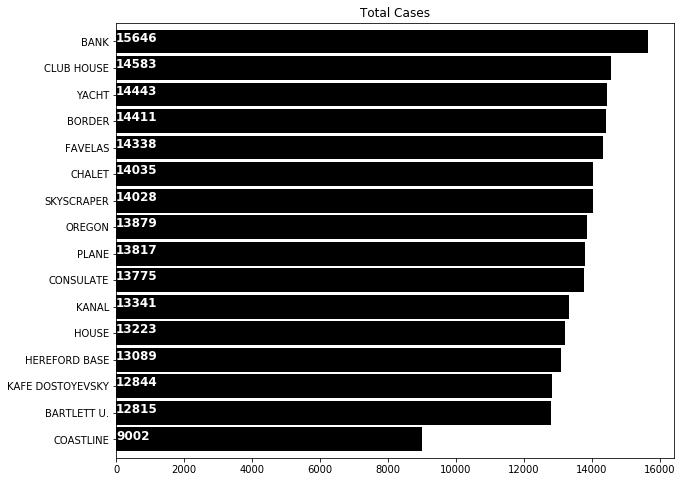

In [11]:
plt.figure(figsize=(10,8))
ax=data['mapname'].value_counts().sort_values(ascending=True).plot.barh(width=0.9,color='black')
for i, v in enumerate(data['mapname'].value_counts().sort_values(ascending=True).values): 
    ax.text(.8, i, v,fontsize=12,color='white',weight='bold')
plt.title('Total Cases')
plt.show()

In [22]:
data.groupby('objectivelocation').size().head()

objectivelocation
1F ARMORY ROOM         1991
1F AUNT'S APARTMENT    1445
1F BBQ                  922
1F BBQ / 1F KITCHEN     878
1F BEDROOM             1838
dtype: int64

In [ ]:
plt.figure(figsize=(12,6))
data['YEAR'].value_counts().sort_values().plot(marker='o')
plt.title('H1B Applications per Year')
plt.xlim([2010,2017])
plt.show()

In [23]:
data.groupby('winrole').size().head()

winrole
Attacker    102413
Defender    114856
dtype: int64

In [29]:
import seaborn as sns

def plot_correlation_map(df):
    corr = df.corr()
    _, ax = plt.subplots(figsize=(12, 10))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    _ = sns.heatmap(
        corr,
        cmap=cmap,
        square=True,
        cbar_kws={'shrink': .9},
        ax=ax,
        annot=True,
        annot_kws={'fontsize': 12}
    )
    plt.show()

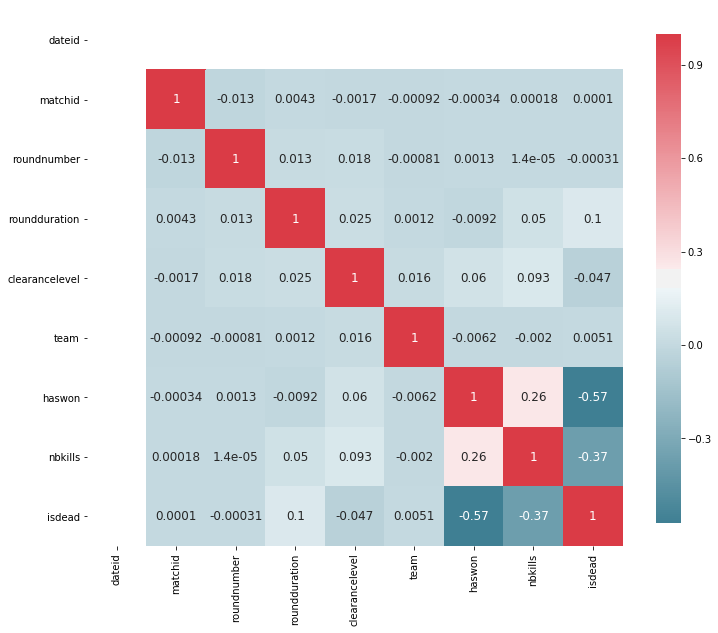

In [30]:
plot_correlation_map(data)

In [56]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure


In [33]:
output_notebook()


Loading BokehJS ...

In [34]:
# create a new plot with default tools, using figure
p = figure(plot_width=400, plot_height=400)

# add a circle renderer with a size, color, and alpha
p.circle(data.clearancelevel, data.skillrank, size=10, line_color="navy", fill_color="orange", fill_alpha=0.5)

show(p) # show the results

In [35]:
# trying a line plot 
# create a new plot (with a title) using figure
p = figure(plot_width=400, plot_height=400, title="My Line Plot")

# add a line renderer
p.line(data.skillrank, data.clearancelevel, line_width=2)

show(p) # show the results

In [36]:
# set up some data
x = data.skillrank
y = data.clearancelevel

# create a new plot with figure
p = figure(plot_width=400, plot_height=400)

# add both a line and circles on the same plot
p.line(x, y, line_width=2)
p.circle(x, y, fill_color="white", size=8)

show(p) # show the results

In [45]:
import bokeh.io
from bokeh.charts import Line, Scatter, output_file

ImportError: cannot import name 'Line'

In [42]:

line = Line(data=winrole, x='Attacker', y='Number')
line.yaxis.axis_label = 'Number of Attackers'
show(line)

NameError: name 'Line' is not defined